# STAT306 Final Group 19

# Data Description

In [1]:
# Library Imports
library(tidyverse)
library(corrplot)
library(ggplot2)
library(car)
library(GGally)
library(rsample)
library(caret)
library(patchwork)

#if needed
#install.packages("corrplot", dependencies=TRUE, repos='http://cran.rstudio.com/')
#install.packages("rsample", dependencies = TRUE, repos = "https://cloud.r-project.org/")
#install.packages("patchwork")

Warning message:
“package ‘lubridate’ was built under R version 4.4.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
corrplot 0.95 loaded

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘packa

In [2]:
gym_membership_data <- read_csv("gym_members_exercise_tracking.csv")
head(gym_membership_data)

Rows: 973 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): Gender, Workout_Type
dbl (13): Age, Weight (kg), Height (m), Max_BPM, Avg_BPM, Resting_BPM, Sessi...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
56,Male,88.3,1.71,180,157,60,1.69,1313,Yoga,12.6,3.5,4,3,30.20
46,Female,74.9,1.53,179,151,66,1.30,883,HIIT,33.9,2.1,4,2,32.00
32,Female,68.1,1.66,167,122,54,1.11,677,Cardio,33.4,2.3,4,2,24.71
25,Male,53.2,1.70,190,164,56,0.59,532,Strength,28.8,2.1,3,1,18.41
38,Male,46.1,1.79,188,158,68,0.64,556,Strength,29.2,2.8,3,1,14.39
56,Female,58.0,1.68,168,156,74,1.59,1116,HIIT,15.5,2.7,5,3,20.55


In [3]:
num_cols <- ncol(gym_membership_data)
cat("This dataset has", num_cols ,"variables.")

This dataset has 15 variables.

In [4]:
n <- nrow(gym_membership_data)
cat("This dataset has", n ,"observations.")

This dataset has 973 observations.

| Variable | Description |
|----------|-------------|
| `Age` | Age of the gym member (years) |
| `Gender` | Gender of the gym member (Male or Female) |
| `Weight` | Member’s weight in kilograms (kg) |
| `Height` | Member’s height in meters (m) |
| `Max_BPM` | Maximum heart rate during workout sessions (beats per minute) |
| `Avg_BPM` | Average heart rate during workout sessions (beats per minute) |
| `Resting_BPM` | Heart rate at rest before workout (beats per minute) |
| `Session_Duration` | Duration of each workout session (hours) |
| `Calories_Burned` | Total calories burned during each session |
| `Workout_Type` | Type of workout performed (e.g., Cardio, Strength, Yoga, HIIT) |
| `Fat_Percentage` | Body fat percentage of the member (%) |
| `Water_Intake` | Daily water intake during workouts (liters) |
| `Workout_Frequency` | Number of workout sessions per week (days/week) |
| `Experience_Level` | Level of experience, from beginner (1) to expert (3) |
| `BMI` | Body Mass Index (Weight in kg / (Height in m)^2) |

# Questions for Investigation

## Insert text here


# Exploratory Data Analysis (EDA)

In [5]:
head(gym_membership_data, 10)

Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
56,Male,88.3,1.71,180,157,60,1.69,1313,Yoga,12.6,3.5,4,3,30.20
46,Female,74.9,1.53,179,151,66,1.30,883,HIIT,33.9,2.1,4,2,32.00
32,Female,68.1,1.66,167,122,54,1.11,677,Cardio,33.4,2.3,4,2,24.71
25,Male,53.2,1.70,190,164,56,0.59,532,Strength,28.8,2.1,3,1,18.41
38,Male,46.1,1.79,188,158,68,0.64,556,Strength,29.2,2.8,3,1,14.39
56,Female,58.0,1.68,168,156,74,1.59,1116,HIIT,15.5,2.7,5,3,20.55
36,Male,70.3,1.72,174,169,73,1.49,1385,Cardio,21.3,2.3,3,2,23.76
40,Female,69.7,1.51,189,141,64,1.27,895,Cardio,30.6,1.9,3,2,30.57
28,Male,121.7,1.94,185,127,52,1.03,719,Strength,28.9,2.6,4,2,32.34


In [6]:
gym_membership_data <- gym_membership_data %>%
  mutate(Gender = as.factor(Gender),
         Workout_Type = as.factor(Workout_Type),
         Experience_Level = as.factor(Experience_Level))

In [7]:
# check for NA
colSums(is.na(gym_membership_data))

Age                        Gender 
                            0                             0 
                  Weight (kg)                    Height (m) 
                            0                             0 
                      Max_BPM                       Avg_BPM 
                            0                             0 
                  Resting_BPM      Session_Duration (hours) 
                            0                             0 
              Calories_Burned                  Workout_Type 
                            0                             0 
               Fat_Percentage         Water_Intake (liters) 
                            0                             0 
Workout_Frequency (days/week)              Experience_Level 
                            0                             0 
                          BMI 
                            0

In [8]:
names(gym_membership_data) <- make.names(names(gym_membership_data))
colnames(gym_membership_data)

[1] "Age"                           "Gender"                       
 [3] "Weight..kg."                   "Height..m."                   
 [5] "Max_BPM"                       "Avg_BPM"                      
 [7] "Resting_BPM"                   "Session_Duration..hours."     
 [9] "Calories_Burned"               "Workout_Type"                 
[11] "Fat_Percentage"                "Water_Intake..liters."        
[13] "Workout_Frequency..days.week." "Experience_Level"             
[15] "BMI"

## Data Visualization

In [9]:
# gym_membership_pair_plots <- 
#     gym_membership_data %>%
#     ggpairs(progress = FALSE) +
#     ggtitle("Pairwise Plots of All Variables") +
#     theme(
#         plot.title = element_text(face = "bold", hjust = 0.5, size = 18),
#         text = element_text(size = 10),
#         axis.title = element_text(face = "bold")
#     ) 

# gym_membership_pair_plots

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


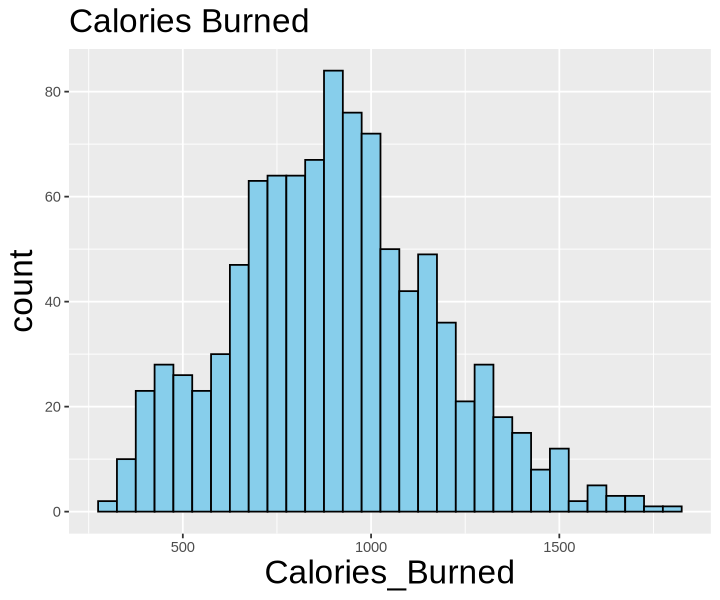

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


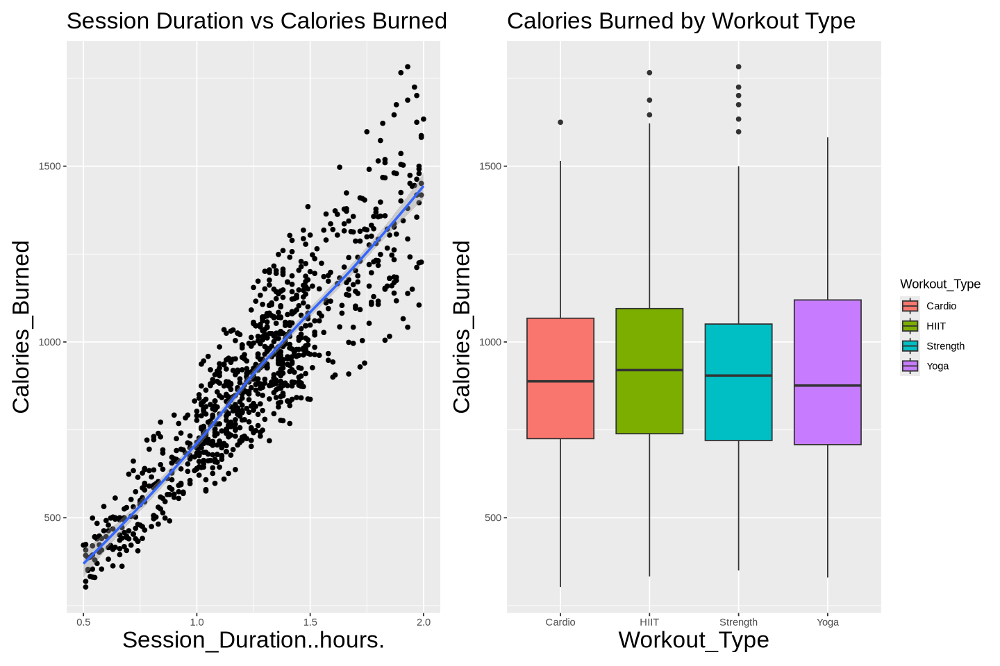

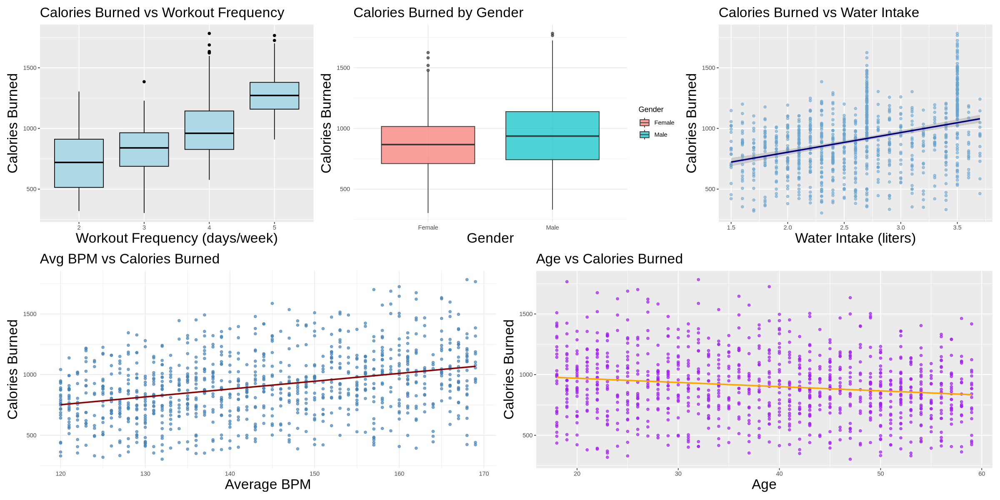

In [20]:
options(repr.plot.width = 6, repr.plot.height = 5)
calorie <- ggplot(gym_membership_data, aes(x = Calories_Burned)) +
  geom_histogram(binwidth = 50, fill = "skyblue", color = "black") +
  labs(title = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

wtype <- ggplot(gym_membership_data, aes(x = Workout_Type, y = Calories_Burned, fill = Workout_Type)) +
  geom_boxplot() +
  labs(title = "Calories Burned by Workout Type")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
duration <- ggplot(gym_membership_data, aes(x = Session_Duration..hours., y = Calories_Burned)) +
  geom_point() +
  geom_smooth() +
  labs(title = "Session Duration vs Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

gender <- ggplot(gym_membership_data, aes(x = Gender, y = Calories_Burned, fill = Gender)) +
  geom_boxplot(alpha = 0.7) +
  labs(title = "Calories Burned by Gender", x = "Gender", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
avg_bpm <- ggplot(gym_membership_data, aes(x = Avg_BPM, y = Calories_Burned)) +
  geom_point(color = "steelblue", alpha = 0.7) +
  geom_smooth(method = "lm", color = "darkred", se = FALSE) +
  labs(title = "Avg BPM vs Calories Burned", x = "Average BPM", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )
rest_bpm <- ggplot(gym_membership_data, aes(x = Resting_BPM, y = Calories_Burned)) +
  geom_point(color = "darkgreen", alpha = 0.7) +
  geom_smooth(method = "lm", color = "black", se = FALSE) +
  labs(title = "Resting BPM vs Calories Burned", x = "Resting BPM", y = "Calories Burned") +
  theme_minimal()+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

age <- ggplot(gym_membership_data, aes(x = Age, y = Calories_Burned)) +
  geom_point(color = "purple", alpha = 0.7) +
  geom_smooth(method = "lm", color = "orange", se = FALSE) +
  labs(title = "Age vs Calories Burned", x = "Age", y = "Calories Burned") + 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

freq <- ggplot(gym_membership_data, aes(x = factor(Workout_Frequency..days.week.), y = Calories_Burned)) +
  geom_boxplot(fill = "lightblue", color = "black") +
  labs(title = "Calories Burned vs Workout Frequency", x = "Workout Frequency (days/week)", y = "Calories Burned") + 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

water <- ggplot(gym_membership_data, aes(x = Water_Intake..liters., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "skyblue3") +
  geom_smooth(method = "lm", color = "navy") +
  labs(title = "Calories Burned vs Water Intake", x = "Water Intake (liters)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

calorie
options(repr.plot.width = 12, repr.plot.height = 8)
(duration |wtype)
options(repr.plot.width = 20, repr.plot.height = 10)
(freq | gender | water)/(avg_bpm | age)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


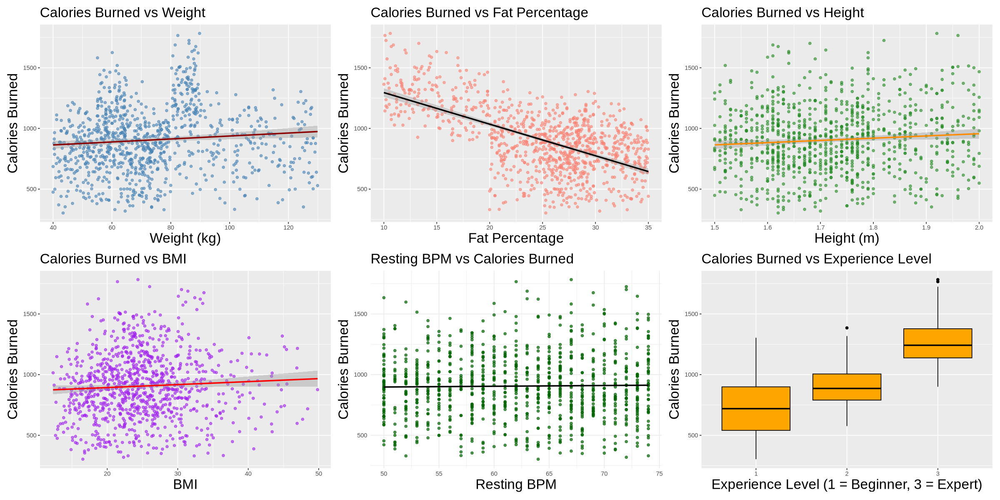

In [19]:
weight <- ggplot(gym_membership_data, aes(x = Weight..kg., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "steelblue") +
  geom_smooth(method = "lm", se = TRUE, color = "darkred") +
  labs(title = "Calories Burned vs Weight", x = "Weight (kg)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

height <- ggplot(gym_membership_data, aes(x = Height..m., y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "forestgreen") +
  geom_smooth(method = "lm", color = "darkorange") +
  labs(title = "Calories Burned vs Height", x = "Height (m)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

bmi <- ggplot(gym_membership_data, aes(x = BMI, y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "purple") +
  geom_smooth(method = "lm", color = "red") +
  labs(title = "Calories Burned vs BMI", x = "BMI", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )


fat <- ggplot(gym_membership_data, aes(x = Fat_Percentage, y = Calories_Burned)) +
  geom_point(alpha = 0.6, color = "salmon") +
  geom_smooth(method = "lm", color = "black") +
  labs(title = "Calories Burned vs Fat Percentage", x = "Fat Percentage", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )

exp <- ggplot(gym_membership_data, aes(x = factor(Experience_Level), y = Calories_Burned)) +
  geom_boxplot(fill = "orange", color = "black") +
  labs(title = "Calories Burned vs Experience Level", x = "Experience Level (1 = Beginner, 3 = Expert)", y = "Calories Burned")+ 
    theme(plot.title = element_text(size = 20), 
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20) )


options(repr.plot.width = 20, repr.plot.height = 10)
(weight | fat | height )/(bmi | rest_bpm | exp)

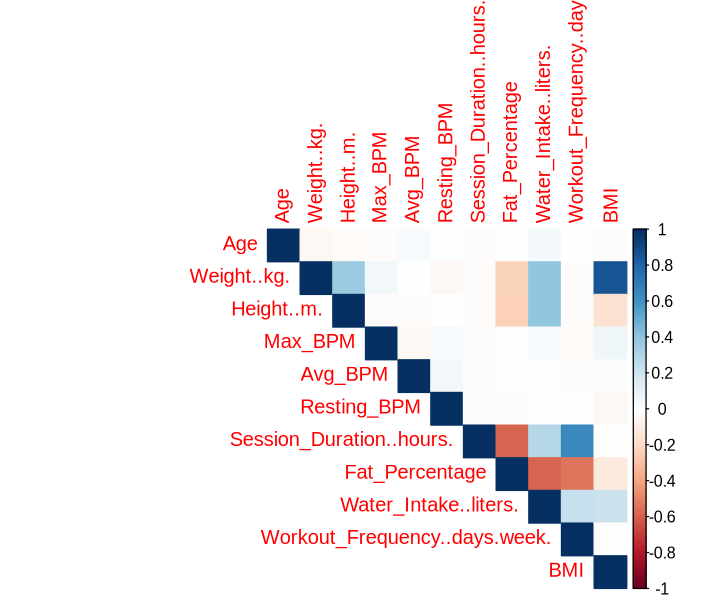

In [12]:
# Correlation matrix for numeric variables
options(repr.plot.width = 6, repr.plot.height = 5)
num_vars <- gym_membership_data %>% 
    select(where(is.numeric)) %>% 
    select(-Calories_Burned)
corrplot(cor(num_vars), method = "color", type = "upper")

# Base model + motivation for feature selection

In [12]:
split <- initial_split(gym_membership_data, prop = 0.7)
gym_membership_train <- training(split)
gym_membership_test <- testing(split)

In [13]:
base_model <- lm(Calories_Burned ~ ., data = gym_membership_train)
summary(base_model)


Call:
lm(formula = Calories_Burned ~ ., data = gym_membership_train)

Residuals:
    Min      1Q  Median      3Q     Max 
-128.74  -23.68   -1.58   22.49  169.31 

Coefficients:
                                Estimate Std. Error t value Pr(>|t|)    
(Intercept)                   -1.058e+03  1.019e+02 -10.392   <2e-16 ***
Age                           -3.311e+00  1.246e-01 -26.565   <2e-16 ***
GenderMale                     7.985e+01  6.284e+00  12.708   <2e-16 ***
Weight..kg.                   -1.265e+00  5.996e-01  -2.110   0.0353 *  
Height..m.                     1.406e+02  5.450e+01   2.580   0.0101 *  
Max_BPM                       -4.792e-02  1.322e-01  -0.362   0.7171    
Avg_BPM                        6.185e+00  1.065e-01  58.050   <2e-16 ***
Resting_BPM                    3.687e-01  2.104e-01   1.752   0.0802 .  
Session_Duration..hours.       7.157e+02  7.223e+00  99.087   <2e-16 ***
Workout_TypeHIIT              -7.361e-01  4.432e+00  -0.166   0.8681    
Workout_TypeStreng

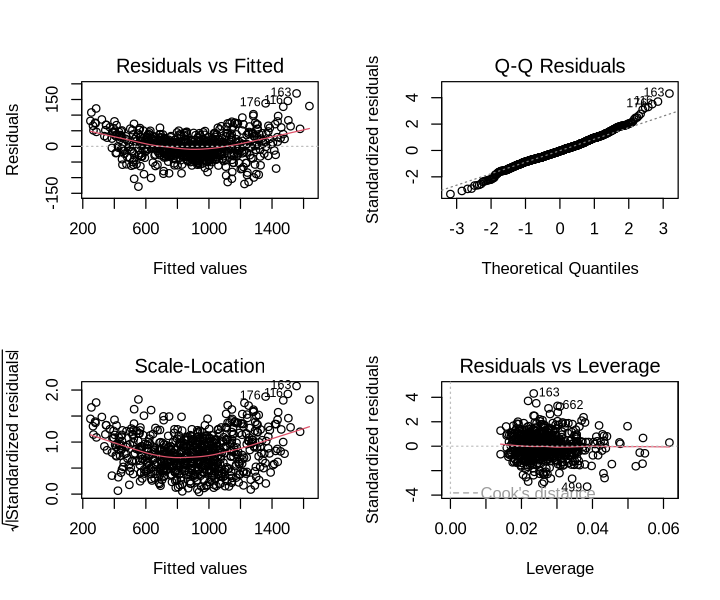

In [14]:
par(mfrow = c(2, 2))
plot(base_model)
par(mfrow = c(1,1))

In [15]:
vif(base_model)

,GVIF,Df,GVIF^(1/(2*Df))
Age,1.024380,1,1.012117
Gender,4.253002,1,2.062281
Weight..kg.,71.892771,1,8.478960
Height..m.,21.313300,1,4.616633
Max_BPM,1.023618,1,1.011740
Avg_BPM,1.011659,1,1.005813
Resting_BPM,1.017882,1,1.008901
Session_Duration..hours.,2.660462,1,1.631092
Workout_Type,1.069186,3,1.011212
Fat_Percentage,5.284765,1,2.298862


In [16]:
null_model <- lm(Calories_Burned ~ 1, data = gym_membership_train)

full_model <- lm(Calories_Burned ~ ., data = gym_membership_train)

forward_model <- step(null_model, 
                      scope = formula(full_model), 
                      direction = "forward")
forward_model

Start:  AIC=7637.42
Calories_Burned ~ 1

                                Df Sum of Sq      RSS    AIC
+ Session_Duration..hours.       1  41474533  8932436 6461.0
+ Experience_Level               2  24980934 25426036 7175.4
+ Workout_Frequency..days.week.  1  16355687 34051282 7372.3
+ Fat_Percentage                 1  16338101 34068869 7372.6
+ Water_Intake..liters.          1   6005451 44401519 7553.0
+ Avg_BPM                        1   5702079 44704890 7557.7
+ Age                            1   1345891 49061079 7621.0
+ Gender                         1   1240063 49166907 7622.5
+ Weight..kg.                    1    600124 49806845 7631.3
+ BMI                            1    301378 50105591 7635.3
+ Height..m.                     1    245447 50161523 7636.1
<none>                                       50406970 7637.4
+ Workout_Type                   3    417850 49989120 7637.8
+ Resting_BPM                    1     13134 50393836 7639.2
+ Max_BPM                        1      1377


Call:
lm(formula = Calories_Burned ~ Session_Duration..hours. + Avg_BPM + 
    Gender + Age + Resting_BPM, data = gym_membership_train)

Coefficients:
             (Intercept)  Session_Duration..hours.                   Avg_BPM  
               -822.1216                  715.3268                    6.1897  
              GenderMale                       Age               Resting_BPM  
                 87.2101                   -3.3080                    0.3464  


In [17]:
cv_control <- trainControl(method = "cv", number = 5)

In [18]:
library(caret)

cv_control <- trainControl(method = "cv", number = 5)

model_1 <- train(Calories_Burned ~ Session_Duration..hours., 
                 data = gym_membership_train, method = "lm", trControl = cv_control)

model_2 <- train(Calories_Burned ~ Session_Duration..hours. + Avg_BPM, 
                 data = gym_membership_train, method = "lm", trControl = cv_control)

model_3 <- train(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender, 
                 data = gym_membership_train, method = "lm", trControl = cv_control)

model_4 <- train(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender + Age, 
                 data = gym_membership_train, method = "lm", trControl = cv_control)

model_5 <- train(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender + Age + Resting_BPM, 
                 data = gym_membership_train, method = "lm", trControl = cv_control)
extended_model <- train(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender + 
                    Age + Resting_BPM + Workout_Type, 
                 data = gym_membership_train, method = "lm", trControl = cv_control)

model_6 <- train(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender + Age + Resting_BPM + Fat_Percentage, 
                 data = gym_membership_train, method = "lm", trControl = cv_control)

model_7 <- train(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender + Age + Resting_BPM + Fat_Percentage + BMI, 
                 data = gym_membership_train, method = "lm", trControl = cv_control)



Call:
summary.resamples(object = results)

Models: Model1, Model2, Model3, Model4, Model5, Model6, Model7, Extended 
Number of resamples: 5 

MAE 
             Min.  1st Qu.   Median     Mean  3rd Qu.      Max. NA's
Model1   83.31611 84.04568 90.73805 91.33636 91.03260 107.54939    0
Model2   53.24005 53.92054 54.84198 55.57026 57.37729  58.47142    0
Model3   47.43246 47.69660 51.75246 50.42452 52.29626  52.94482    0
Model4   28.64126 29.12752 30.15163 30.29600 30.45455  33.10504    0
Model5   25.80844 29.35724 30.56489 30.04039 31.56291  32.90848    0
Model6   28.47835 29.05887 29.55882 30.17282 31.79565  31.97240    0
Model7   28.53971 28.64042 29.21756 30.27707 30.40243  34.58525    0
Extended 29.43070 29.47791 30.73740 30.24517 30.77174  30.80811    0

RMSE 
              Min.   1st Qu.    Median      Mean   3rd Qu.      Max. NA's
Model1   104.98606 110.93721 113.02835 114.78454 114.31829 130.65281    0
Model2    68.69450  69.38423  73.67389  72.16720  73.86172  75.22164    0
Mo

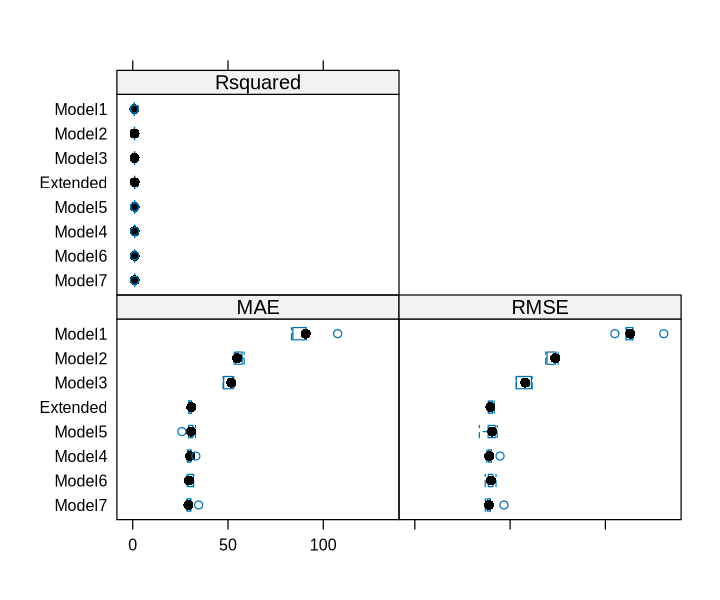

In [19]:
results <- resamples(list(
  Model1 = model_1,
  Model2 = model_2,
  Model3 = model_3,
  Model4 = model_4,
  Model5 = model_5,
  Model6 = model_6,
  Model7 = model_7,
    Extended = extended_model
))

summary(results)
bwplot(results)  # Boxplot of RMSE, R², MAE across 5 folds


# Using Extended Model

In [20]:
# Base Model (again)
base_lm <- lm(Calories_Burned ~ .,
                    data = gym_membership_train)

pred_base_lm <- predict(base_lm, newdata = gym_membership_test)


In [21]:
extended_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Avg_BPM + Gender +
                  Age + Workout_Type, data = gym_membership_train)
pred_extended_lm <- predict(extended_lm, newdata = gym_membership_test)

In [22]:
base_summary <- summary(base_lm)
extended_summary <- summary(extended_lm)

comparison <- data.frame(
  Model = c("Base", "Extended"),
  R_squared = c(base_summary$r.squared, extended_summary$r.squared),
  Adjusted_R_squared = c(base_summary$adj.r.squared, extended_summary$adj.r.squared),
  RMSE = c(
    sqrt(mean((gym_membership_test$Calories_Burned - pred_base_lm)^2)),
    sqrt(mean((gym_membership_test$Calories_Burned - pred_extended_lm)^2))
  )
)
comparison

Model,R_squared,Adjusted_R_squared,RMSE
<chr>,<dbl>,<dbl>,<dbl>
Base,0.9792779,0.9787465,39.50006
Extended,0.9788903,0.9786707,39.47914


In [23]:
importance <- varImp(extended_lm)
print(importance)

                              Overall
Session_Duration..hours. 160.19311989
Avg_BPM                   58.28882996
GenderMale                28.61681854
Age                       26.69112199
Workout_TypeHIIT           0.12307102
Workout_TypeStrength       0.09599847
Workout_TypeYoga           1.61338521


In [24]:
vif(extended_lm)

,GVIF,Df,GVIF^(1/(2*Df))
Session_Duration..hours.,1.013743,1,1.006848
Avg_BPM,1.002150,1,1.001074
Gender,1.003532,1,1.001765
Age,1.005965,1,1.002978
Workout_Type,1.021775,3,1.003597


# SEIF model diagnostic + selection

In [ ]:
base_lm <- lm(Calories_Burned ~ Session_Duration..hours. + Workout_Type + Workout_Frequency..days.week. + Gender + Water_Intake..liters. + Avg_BPM + Age, data = gym_membership_data)
summary(base_lm)

In [ ]:
qqnorm(residuals(base_lm))
qqline(residuals(base_lm), col = "red")

plot(fitted(base_lm), residuals(base_lm),
     xlab = "Fitted values", ylab = "Residuals",
     main = "Residuals vs Fitted")
abline(h = 0, col = "red")

In [ ]:
null_model <- lm(Calories_Burned ~ 1, data = gym_membership_data)

full_model <- lm(Calories_Burned ~ 
  Workout_Type * Avg_BPM + 
  Workout_Type * Session_Duration..hours. + 
  Gender * Avg_BPM + 
  Gender * Age + 
  Water_Intake..liters. +
  I(Workout_Frequency..days.week.^2) +
  I(Avg_BPM^2) +
  I(Age^2),
  data = gym_membership_data)

forward_model <- step(null_model, 
                      scope = formula(full_model), 
                      direction = "forward")
summary(forward_model)

In [ ]:
stepwise_model <- step(full_model, direction = "both", trace = FALSE)
summary(stepwise_model)

In [ ]:
qqnorm(residuals(forward_model))
qqline(residuals(forward_model), col = "red")

In [ ]:
plot(fitted(forward_model), residuals(forward_model),
     xlab = "Fitted values", ylab = "Residuals",
     main = "Residuals vs Fitted")
abline(h = 0, col = "red")